# League Of Legends

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
sns.set_style('darkgrid')

## Load Data

In [2]:
data = pd.read_csv('Data/data.csv')

## Exploratory Data Analysis

In [3]:
# import graph objects as "go"
# pip install plotly
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode, iplot, plot

In [4]:
data.describe()

,gameId,gameDuration,blueWin,blueWardsplaced,blueWardskilled,blueDeaths,blueKills,blueAssists,blueTotaldamagedealttochampions,blueGoldearned,...,blueBaronkills,redFirstbaron,redFirstblood,redFirsttower,redFirstinhibitor,redInhibitorkills,redDragonkills,redTowerkills,redFirstdragon,redBaronkills
count,1.999250e+05,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,...,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000
mean,4.165346e+09,1433.434008,0.495956,53.435953,19.546830,24.713192,24.722391,40.390066,69502.006177,47927.720850,...,0.297737,0.260148,0.491284,0.471772,0.370414,0.633047,1.518875,4.275318,0.485932,0.329649
std,9.232801e+07,432.490237,0.499985,30.366550,14.672436,13.539332,13.542270,29.143799,37443.355868,16069.281604,...,0.535042,0.438716,0.499925,0.499204,0.482917,0.901632,1.307739,3.392751,0.499803,0.558915
min,3.163679e+09,132.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3355.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,4.136114e+09,1125.000000,0.000000,33.000000,8.000000,15.000000,15.000000,20.000000,41608.000000,36540.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,4.191588e+09,1420.000000,0.000000,53.000000,18.000000,24.000000,24.000000,35.000000,64485.000000,47898.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,0.000000,0.000000
75%,4.222887e+09,1732.000000,1.000000,73.000000,29.000000,33.000000,33.000000,54.000000,90893.000000,58824.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,7.000000,1.000000,1.000000
max,4.261026e+09,3758.000000,1.000000,230.000000,118.000000,117.000000,112.000000,256.000000,381484.000000,134323.000000,...,4.000000,1.000000,1.000000,1.000000,1.000000,10.000000,7.000000,11.000000,1.000000,5.000000


In [5]:
data.columns

Index(['gameId', 'gameDuration', 'blueWin', 'blueWardsplaced',
       'blueWardskilled', 'blueDeaths', 'blueKills', 'blueAssists',
       'blueTotaldamagedealttochampions', 'blueGoldearned',
       'blueTotalminionskilled', 'blueChamplevel', 'blueNeutralminionskilled',
       'blueKillingsprees', 'blueTotalheal', 'blueDamagedealttoobjectives',
       'redWin', 'redWardsplaced', 'redWardskilled', 'redDeaths', 'redKills',
       'redAssists', 'redTotaldamagedealttochampions', 'redGoldearned',
       'redTotalminionskilled', 'redChamplevel', 'redNeutralminionskilled',
       'redKillingsprees', 'redTotalheal', 'redDamagedealttoobjectives',
       'blueFirstbaron', 'blueFirstblood', 'blueFirsttower',
       'blueFirstinhibitor', 'blueInhibitorkills', 'blueDragonkills',
       'blueTowerkills', 'blueFirstdragon', 'blueBaronkills', 'redFirstbaron',
       'redFirstblood', 'redFirsttower', 'redFirstinhibitor',
       'redInhibitorkills', 'redDragonkills', 'redTowerkills',
       'redFirstdrag

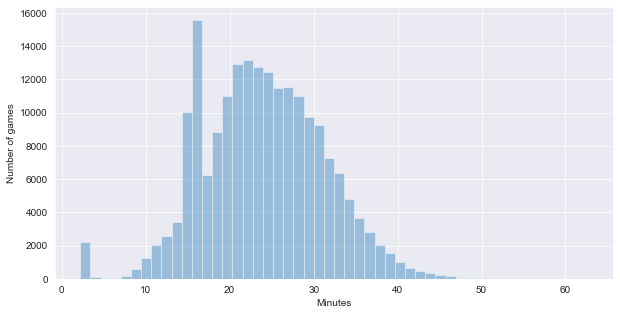

In [6]:
duration = data['gameDuration']/60 # convert second to minute.

plt.figure(figsize=(10,5))
sns.distplot(data['gameDuration']/60, hist=True, kde=False)
plt.xlabel('Minutes')
plt.ylabel('Number of games')

plt.show()

__Note:__ Most matches have the matching time around 10 to 15 minutes

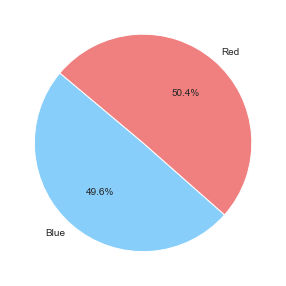

In [7]:
blue = data['blueWin'].mean()
red = data['redWin'].mean()

colors = ['lightskyblue', 'lightcoral']
sizes = [blue, red]
labels = ['Blue', 'Red']
plt.figure(figsize=(10,5))
plt.pie(sizes, autopct='%1.1f%%', startangle=140, colors=colors, labels=labels)
plt.show()

## Blue Team Features

In [8]:
bluefeats = data.columns[data.columns.str.contains(pat = 'blue')]
bluefeats

Index(['blueWin', 'blueWardsplaced', 'blueWardskilled', 'blueDeaths',
       'blueKills', 'blueAssists', 'blueTotaldamagedealttochampions',
       'blueGoldearned', 'blueTotalminionskilled', 'blueChamplevel',
       'blueNeutralminionskilled', 'blueKillingsprees', 'blueTotalheal',
       'blueDamagedealttoobjectives', 'blueFirstbaron', 'blueFirstblood',
       'blueFirsttower', 'blueFirstinhibitor', 'blueInhibitorkills',
       'blueDragonkills', 'blueTowerkills', 'blueFirstdragon',
       'blueBaronkills'],
      dtype='object')

In [9]:
blue_df = data[bluefeats]
blue_df.head()

,blueWin,blueWardsplaced,blueWardskilled,blueDeaths,blueKills,blueAssists,blueTotaldamagedealttochampions,blueGoldearned,blueTotalminionskilled,blueChamplevel,...,blueDamagedealttoobjectives,blueFirstbaron,blueFirstblood,blueFirsttower,blueFirstinhibitor,blueInhibitorkills,blueDragonkills,blueTowerkills,blueFirstdragon,blueBaronkills
0,0,129,39,36,26,45,101607,63447,774,80,...,31019,1,0,0,0,0,1,2,1,1
1,0,72,26,31,16,30,70270,47107,601,65,...,31788,0,0,1,0,0,0,2,0,0
2,1,79,39,20,36,88,102449,59163,613,71,...,67404,1,1,1,1,2,2,10,0,1
3,1,43,20,11,20,34,56652,39014,486,57,...,37483,0,0,1,0,0,1,4,1,0
4,1,49,16,7,21,38,57342,42933,509,61,...,48691,0,0,0,1,1,3,7,1,0


In [10]:
blue_df.shape

(199925, 23)

## Red Team Features
Both teams have the same attributes or features, so we just consider one side to understand the data.

In [11]:
redfeats = data.columns[data.columns.str.contains(pat = 'red')]
redfeats

Index(['redWin', 'redWardsplaced', 'redWardskilled', 'redDeaths', 'redKills',
       'redAssists', 'redTotaldamagedealttochampions', 'redGoldearned',
       'redTotalminionskilled', 'redChamplevel', 'redNeutralminionskilled',
       'redKillingsprees', 'redTotalheal', 'redDamagedealttoobjectives',
       'redFirstbaron', 'redFirstblood', 'redFirsttower', 'redFirstinhibitor',
       'redInhibitorkills', 'redDragonkills', 'redTowerkills',
       'redFirstdragon', 'redBaronkills'],
      dtype='object')

In [12]:
red_df = data[redfeats]
red_df.head()

,redWin,redWardsplaced,redWardskilled,redDeaths,redKills,redAssists,redTotaldamagedealttochampions,redGoldearned,redTotalminionskilled,redChamplevel,...,redDamagedealttoobjectives,redFirstbaron,redFirstblood,redFirsttower,redFirstinhibitor,redInhibitorkills,redDragonkills,redTowerkills,redFirstdragon,redBaronkills
0,1,96,56,26,36,72,125866,70528,832,84,...,88202,0,1,1,0,0,3,6,0,1
1,1,72,29,16,31,59,78424,58032,640,73,...,61040,1,1,0,1,1,4,7,1,1
2,0,76,28,36,20,30,62134,47408,608,63,...,32107,0,0,0,0,0,2,1,1,0
3,0,47,19,20,11,13,32999,32064,461,53,...,10775,0,1,0,0,0,0,1,0,0
4,0,43,17,21,7,5,35272,35372,506,54,...,24158,0,1,1,0,0,0,3,0,0


In [13]:
red_df.shape

(199925, 23)

## Data Distribution

In [14]:
blue_df.describe()

,blueWin,blueWardsplaced,blueWardskilled,blueDeaths,blueKills,blueAssists,blueTotaldamagedealttochampions,blueGoldearned,blueTotalminionskilled,blueChamplevel,...,blueDamagedealttoobjectives,blueFirstbaron,blueFirstblood,blueFirsttower,blueFirstinhibitor,blueInhibitorkills,blueDragonkills,blueTowerkills,blueFirstdragon,blueBaronkills
count,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,...,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000
mean,0.495956,53.435953,19.546830,24.713192,24.722391,40.390066,69502.006177,47927.720850,500.115508,64.714923,...,37124.712532,0.236684,0.506535,0.515863,0.382794,0.647063,1.356744,4.343939,0.403616,0.297737
std,0.499985,30.366550,14.672436,13.539332,13.542270,29.143799,37443.355868,16069.281604,177.536438,14.815999,...,26588.654755,0.425048,0.499959,0.499750,0.486070,0.910116,1.254504,3.377381,0.490623,0.535042
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3355.000000,0.000000,5.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,33.000000,8.000000,15.000000,15.000000,20.000000,41608.000000,36540.000000,383.000000,55.000000,...,13646.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,0.000000,53.000000,18.000000,24.000000,24.000000,35.000000,64485.000000,47898.000000,515.000000,66.000000,...,33123.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.000000,4.000000,0.000000,0.000000
75%,1.000000,73.000000,29.000000,33.000000,33.000000,54.000000,90893.000000,58824.000000,623.000000,75.000000,...,56808.000000,0.000000,1.000000,1.000000,1.000000,1.000000,2.000000,7.000000,1.000000,1.000000
max,1.000000,230.000000,118.000000,117.000000,112.000000,256.000000,381484.000000,134323.000000,1514.000000,141.000000,...,167692.000000,1.000000,1.000000,1.000000,1.000000,9.000000,7.000000,11.000000,1.000000,4.000000


In [15]:
red_df.describe()

,redWin,redWardsplaced,redWardskilled,redDeaths,redKills,redAssists,redTotaldamagedealttochampions,redGoldearned,redTotalminionskilled,redChamplevel,...,redDamagedealttoobjectives,redFirstbaron,redFirstblood,redFirsttower,redFirstinhibitor,redInhibitorkills,redDragonkills,redTowerkills,redFirstdragon,redBaronkills
count,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,...,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000,199925.000000
mean,0.504044,53.561486,19.222493,24.806562,24.625590,40.247978,69241.998725,48022.229046,505.554458,64.914903,...,36892.539087,0.260148,0.491284,0.471772,0.370414,0.633047,1.518875,4.275318,0.485932,0.329649
std,0.499985,30.595516,14.454942,13.557760,13.526112,29.041446,37440.925824,16271.618084,181.302212,14.953548,...,26916.048868,0.438716,0.499925,0.499204,0.482917,0.901632,1.307739,3.392751,0.499803,0.558915
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,33.000000,8.000000,15.000000,15.000000,20.000000,41312.000000,36472.000000,386.000000,55.000000,...,12739.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
50%,1.000000,53.000000,18.000000,24.000000,24.000000,35.000000,64284.000000,48029.000000,522.000000,66.000000,...,32483.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,0.000000,0.000000
75%,1.000000,73.000000,28.000000,33.000000,33.000000,54.000000,90679.000000,59101.000000,631.000000,75.000000,...,57311.000000,1.000000,1.000000,1.000000,1.000000,1.000000,2.000000,7.000000,1.000000,1.000000
max,1.000000,248.000000,117.000000,112.000000,116.000000,229.000000,359184.000000,141692.000000,1443.000000,145.000000,...,197135.000000,1.000000,1.000000,1.000000,1.000000,10.000000,7.000000,11.000000,1.000000,5.000000


## Correlation

In [16]:
blue_corr = data.corr()['blueWin'].sort_values(axis=0, ascending=False)
red_corr = data.corr()['redWin'].sort_values(axis=0, ascending=False) 
print(red_corr.head())

redWin                        1.000000
redTowerkills                 0.722430
redFirstinhibitor             0.645034
redInhibitorkills             0.569259
redDamagedealttoobjectives    0.551108
Name: redWin, dtype: float64


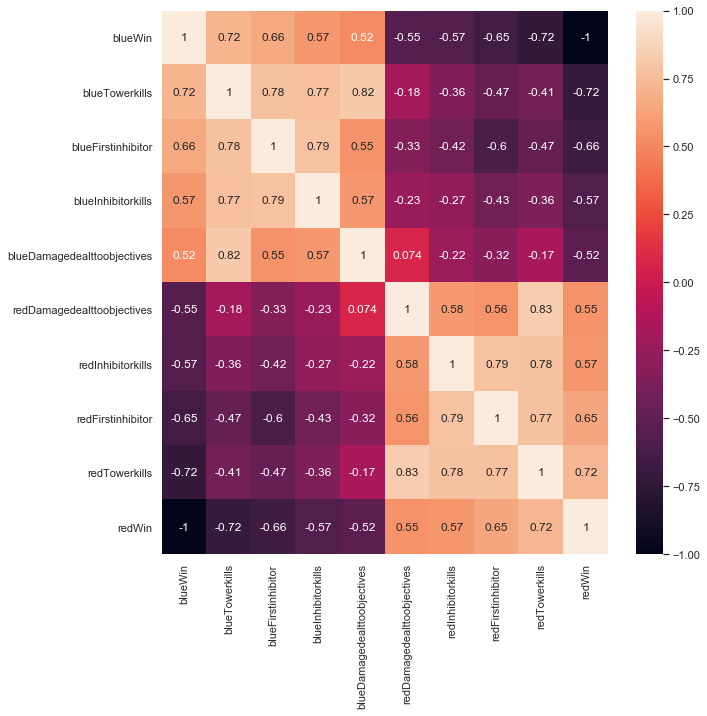

In [17]:
corr_columns = [feat for feat,corr in blue_corr.iteritems() if abs(corr)>0.5] # columns that have more than 0.5 of corr
plt.figure(figsize=(10,10))
sns.set(font_scale = 1)
sns.heatmap(data[corr_columns].corr(), annot=True)

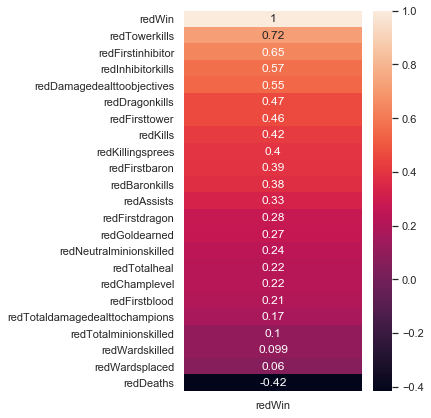

In [18]:
plt.figure(figsize=(4,7))
red_corra = [feat for feat,corr in blue_corr.iteritems() if 'red' in feat] # list of columns that belong to red team
red_corra = red_corr[red_corra].sort_values(axis=0, ascending=False).to_frame()
sns.heatmap(red_corra, annot=True)

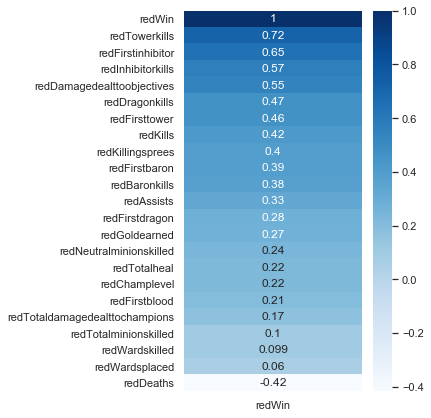

In [19]:
plt.figure(figsize=(4,7))
blue_corra = [feat for feat,corr in blue_corr.iteritems() if 'blue' in feat] # list of columns that belong to red team
blue_corra = blue_corr[blue_corra].sort_values(axis=0, ascending=False).to_frame()
sns.heatmap(red_corra, annot=True, cmap='Blues')

__Comments:__


## Histogram Feateres 

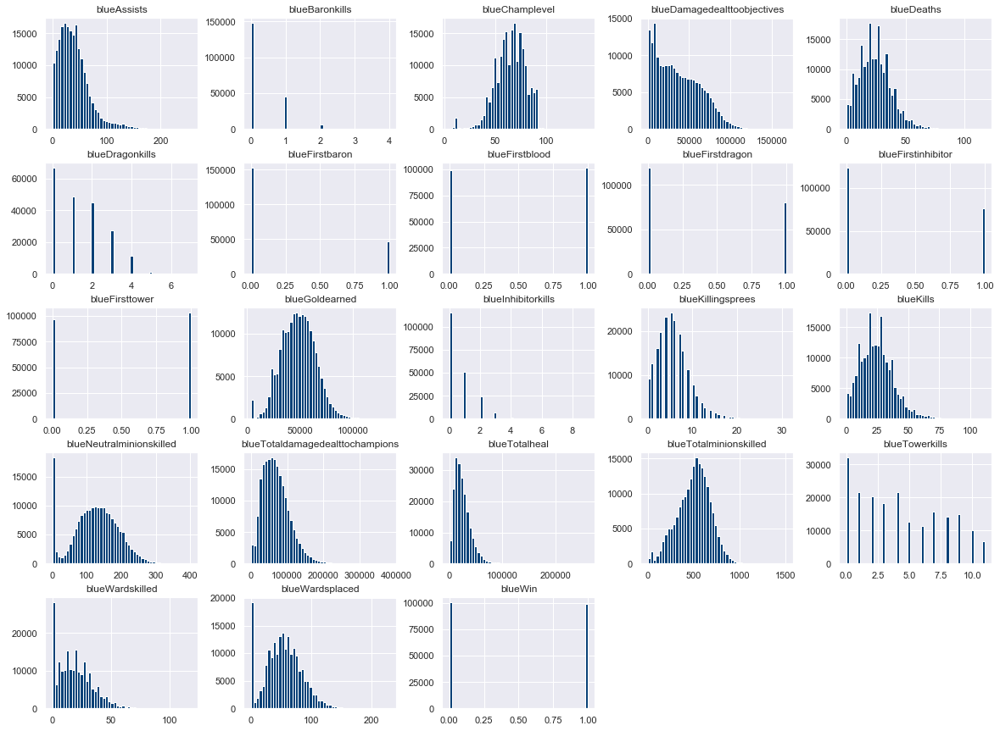

In [20]:
blue_df.hist(bins=50, color='#084177', figsize=(20,15))
plt.show()

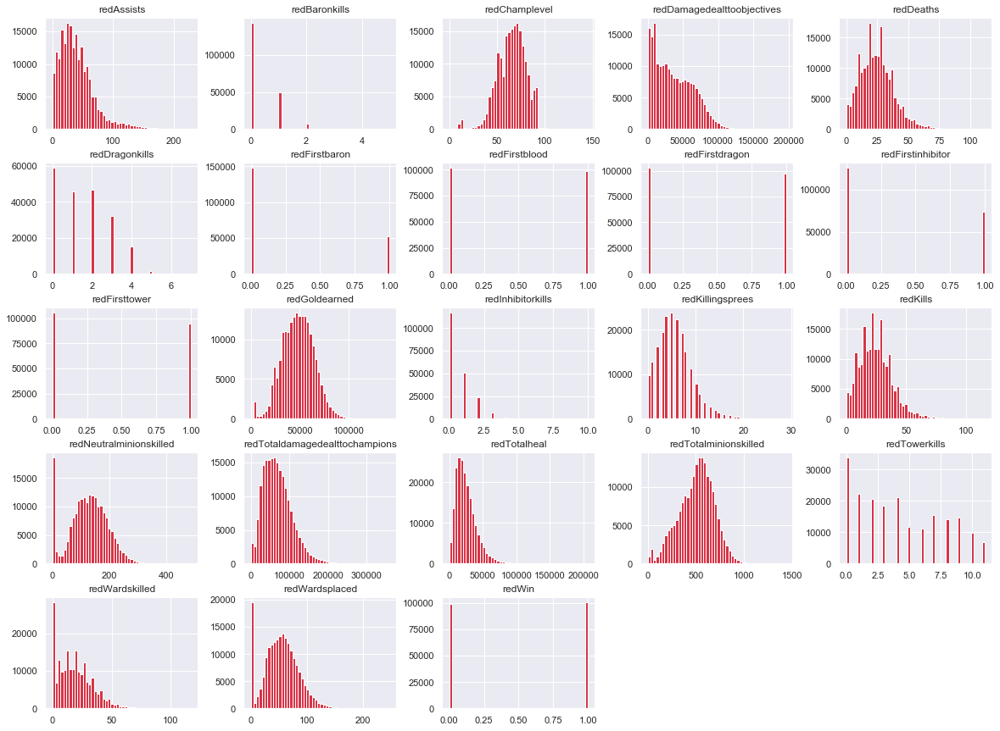

In [21]:
red_df.hist(bins=50, color='#d63447', figsize=(20,15))
plt.show()

### Ward Destroyed

In [22]:
fig = go.Figure(data=[
    go.Histogram(x=blue_df['blueWardskilled'],name='Blue Win'),    
    go.Histogram(x=red_df['redWardskilled'],name='Red Win')
])

fig.update_layout(
    title='Wards Destroyed Distribution',
    height=800,
    width=800
)

iplot(fig)

__Comments:__
* Based on the correlation and a diagram above, it shows that ward destroyed also a key to winning.
* The distribution is right skew or positive skew. 
* In updating of the LoL game, the gamers destroyed 0 wards that ranked number one.  

## Gold Earned

In [23]:
fig = go.Figure(data=[
    go.Histogram(x=blue_df['blueGoldearned'],name='Blue Win',opacity=1),    
    go.Histogram(x=red_df['redGoldearned'],name='Red Win',opacity=0.5)
])

fig.update_layout(
    title='Gold Earned Distribution 2 Teams',
    height=800,
    width=800
)

iplot(fig)

Text(0.5, 1.0, 'Gold Earned 2 Teams')

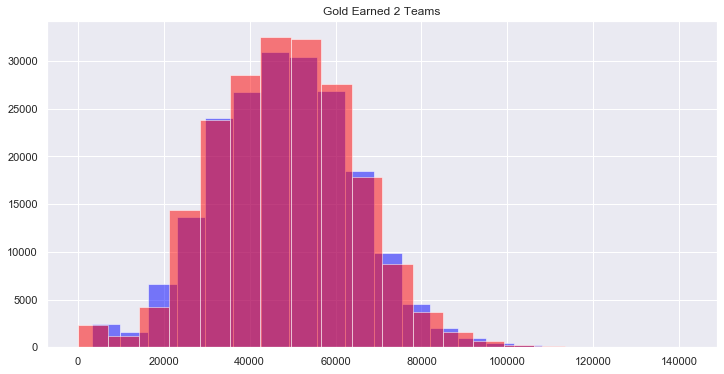

In [24]:
plt.figure(figsize=(12,6))
blue_df['blueGoldearned'].hist(color='blue', alpha=.5, bins=20)
red_df['redGoldearned'].hist(color='red',alpha=.5, bins=20)
plt.title("Gold Earned 2 Teams")

## Checking the NaN values in the data set

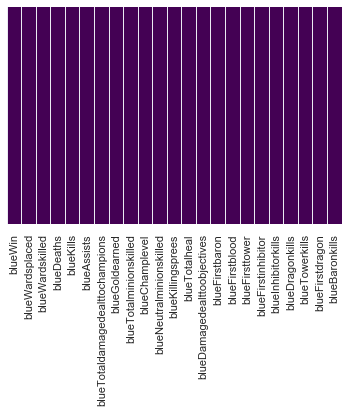

In [25]:
# deal with the NaN values in the data
sns.heatmap(blue_df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

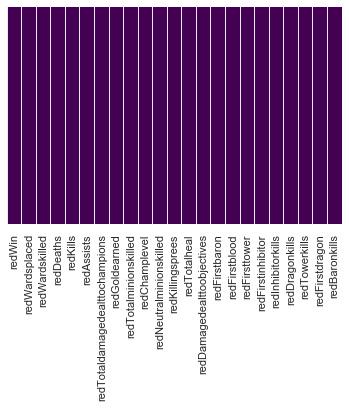

In [26]:
# deal with the NaN values in the data
sns.heatmap(red_df.isnull(),yticklabels=False,cbar=False,cmap='viridis')

## Import Library

In [27]:
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.feature_selection import RFE
from sklearn.preprocessing import StandardScaler

## Normalize the data

In [28]:
scaler = StandardScaler()
features = data.drop(['blueWin','redWin','gameId'],axis=1)
# Fit Scaler to the features
scaler.fit(features)
scaled_features = scaler.transform(features)
df_features = pd.DataFrame(scaled_features, columns= features.columns)

## Train Test Split

In [29]:
X = df_features
y = data['redWin']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2,random_state=42)
# checking shapes of each
print("X_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("X_test shape: ", X_test.shape)
print("y_test.shape: ", y_test.shape)

X_train shape:  (159940, 45)
y_train shape:  (159940,)
X_test shape:  (39985, 45)
y_test.shape:  (39985,)


# Linear Regression

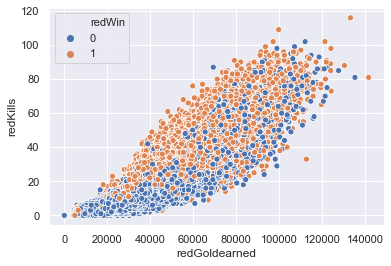

In [30]:
sns.scatterplot(data=red_df, x='redGoldearned', y='redKills', hue='redWin')

In [31]:
linear_reg = linear_model.LinearRegression()
linear_reg.fit(X_train, y_train)
print("y = x *", linear_reg.coef_, "+", linear_reg.intercept_)
train_predicted = linear_reg.predict(X_train)
test_predicted = linear_reg.predict(X_test)

y = x * [ 0.00504617  0.01357841  0.01117461  0.01226454  0.07203997 -0.05863309
 -0.04997686 -0.35974347  0.05915551 -0.40538753  0.0643199  -0.03201735
 -0.01315667  0.00884432 -0.01348167 -0.00900076  0.02648603 -0.08933748
  0.05340143  0.04740812  0.35093386 -0.05862058  0.40410112 -0.07099274
  0.02513985  0.01427639 -0.0031122   0.01538193  0.0342606   0.00049437
 -0.00606588 -0.04007262 -0.01903631 -0.03492518 -0.01037177 -0.00182096
 -0.01744365  0.02902134 -0.00147537 -0.00750591  0.04102672  0.02584212
  0.04458066 -0.01899683  0.00188931] + 0.5036392307362896


In [32]:
#MSE
mse_train = ((np.array(y_train)-train_predicted)**2).sum()/len(y_train)
mse_test = ((np.array(y_test)-test_predicted)**2).sum()/len(y_test)

#R2
r2_train = r2_score(y_train, train_predicted)
r2_test = r2_score(y_test, test_predicted)
print("MSE of Training set:", mse_train)
print("MSE of Testing set:", mse_test)
print("R Squared of Training set:", r2_train)
print("R Squared of Testing set:", r2_test)

MSE of Training set: 0.03830729853253663
MSE of Testing set: 0.03841717100991376
R Squared of Training set: 0.8467607132172783
R Squared of Testing set: 0.8463215345792349


__Comments:__ This linear model is good fit. This shows that any gold earned can predict the outcome of blue killed or red killed.

## Feature Selection

In [33]:
feature_cols = data.columns.drop(['gameId','blueWin','redWin'])
feature_cols

Index(['gameDuration', 'blueWardsplaced', 'blueWardskilled', 'blueDeaths',
       'blueKills', 'blueAssists', 'blueTotaldamagedealttochampions',
       'blueGoldearned', 'blueTotalminionskilled', 'blueChamplevel',
       'blueNeutralminionskilled', 'blueKillingsprees', 'blueTotalheal',
       'blueDamagedealttoobjectives', 'redWardsplaced', 'redWardskilled',
       'redDeaths', 'redKills', 'redAssists', 'redTotaldamagedealttochampions',
       'redGoldearned', 'redTotalminionskilled', 'redChamplevel',
       'redNeutralminionskilled', 'redKillingsprees', 'redTotalheal',
       'redDamagedealttoobjectives', 'blueFirstbaron', 'blueFirstblood',
       'blueFirsttower', 'blueFirstinhibitor', 'blueInhibitorkills',
       'blueDragonkills', 'blueTowerkills', 'blueFirstdragon',
       'blueBaronkills', 'redFirstbaron', 'redFirstblood', 'redFirsttower',
       'redFirstinhibitor', 'redInhibitorkills', 'redDragonkills',
       'redTowerkills', 'redFirstdragon', 'redBaronkills'],
      dtype='ob

In [34]:
estimator = LogisticRegression(max_iter=1000,C=1000, random_state=0)
selector = RFE(estimator, 9)  # select 9 features for us
selector = selector.fit(X_train, y_train)
supp = selector.get_support()

In [35]:
print("Selected features:", feature_cols[supp])

Selected features: Index(['blueGoldearned', 'blueChamplevel', 'blueNeutralminionskilled',
       'redGoldearned', 'redChamplevel', 'redNeutralminionskilled',
       'blueTowerkills', 'redTowerkills', 'redBaronkills'],
      dtype='object')


## Select features

In [36]:
feature_cols = ['blueGoldearned', 'blueChamplevel', 'blueNeutralminionskilled',
       'redGoldearned', 'redChamplevel', 'redNeutralminionskilled',
       'blueTowerkills', 'redTowerkills', 'redBaronkills']

#Scale the data
features = data[feature_cols]
# Fit Scaler to the features
scaler.fit(features)
scaled_features = scaler.transform(features)
df_features = pd.DataFrame(scaled_features, columns= features.columns)

## Train Test Split

In [37]:
X = df_features
y = data['redWin']
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size = 0.2,random_state=42)

# checking shapes of each
print("X_train shape: ", X_train.shape)
print("y_train shape: ", y_train.shape)
print("X_test shape: ", X_test.shape)
print("y_test.shape: ", y_test.shape)

X_train shape:  (159940, 9)
y_train shape:  (159940,)
X_test shape:  (39985, 9)
y_test.shape:  (39985,)


# Logistic Regression
Fine-tuning LR model by changing C values

In [38]:
# training model
lr = LogisticRegression(max_iter=200,C=0.1, random_state=0).fit(X_train, y_train)

In [39]:
# Evaluate the model
# making predictions on training and test set
y_pred_train = lr.predict(X_train)
y_pred_test = lr.predict(X_test)

# calculating accuracy score on training set
print("Acc on training set: ", accuracy_score(y_train, y_pred_train))

# calculating accuracy score on test set
print("Acc on test set: ", accuracy_score(y_test, y_pred_test))

Acc on training set:  0.9898211829436039
Acc on test set:  0.9894460422658496


In [40]:
print("Confusion matrix of training model")
print(confusion_matrix(y_train, y_pred_train))
print("Confusion matrix of testing model")
print(confusion_matrix(y_test, y_pred_test))

Confusion matrix of training model
[[78501   820]
 [  808 79811]]
Confusion matrix of testing model
[[19618   215]
 [  207 19945]]


__Comments:__ The logistic regression is overfitting because the model is very complexity and have many features relative to observations. Therefore, it is reason for not using this model to predict the outcome of winning. 

# Neural Network Analysis
By using #Tensorflow <br>
Version: 2.2.0

In [41]:
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import cross_val_score
from scipy.stats import ttest_ind

import warnings
warnings.filterwarnings("ignore")

In [42]:
df_features.columns

Index(['blueGoldearned', 'blueChamplevel', 'blueNeutralminionskilled',
       'redGoldearned', 'redChamplevel', 'redNeutralminionskilled',
       'blueTowerkills', 'redTowerkills', 'redBaronkills'],
      dtype='object')

In [43]:
feat_cols = []
for col in df_features.columns:
    feat_cols.append(tf.feature_column.numeric_column(col))

In [44]:
feat_cols

[NumericColumn(key='blueGoldearned', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='blueChamplevel', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='blueNeutralminionskilled', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='redGoldearned', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='redChamplevel', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='redNeutralminionskilled', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='blueTowerkills', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='redTowerkills', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None),
 NumericColumn(key='redBaronkills', shape=(1,), default_value=None, dtype=tf.float32, normalizer_fn=None)]

### Input Function

In [45]:
input_func = tf.compat.v1.estimator.inputs.pandas_input_fn(x=X_train, y=y_train, batch_size=10000, num_epochs=None, shuffle=True)

### 3 Hidden Layers with 100 units for each

In [46]:
classifier = tf.estimator.DNNClassifier(hidden_units=[100, 100, 100], n_classes=2, feature_columns=feat_cols)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'C:\\Users\\Richard\\AppData\\Local\\Temp\\tmpr94voxkc', '_tf_random_seed': None, '_save_summary_steps': 100, '_save_checkpoints_steps': None, '_save_checkpoints_secs': 600, '_session_config': allow_soft_placement: true
graph_options {
  rewrite_options {
    meta_optimizer_iterations: ONE
  }
}
, '_keep_checkpoint_max': 5, '_keep_checkpoint_every_n_hours': 10000, '_log_step_count_steps': 100, '_train_distribute': None, '_device_fn': None, '_protocol': None, '_eval_distribute': None, '_experimental_distribute': None, '_experimental_max_worker_delay_secs': None, '_session_creation_timeout_secs': 7200, '_service': None, '_cluster_spec': ClusterSpec({}), '_task_type': 'worker', '_task_id': 0, '_global_id_in_cluster': 0, '_master': '', '_evaluation_master': '', '_is_chief': True, '_num_ps_replicas': 0, '_num_worker_replicas': 1}


__Comments:__ By default, activation function is relu

In [47]:
classifier.train(input_fn=input_func,steps=500)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
Instructions for updating:
Use Variable.read_value. Variables in 2.X are initialized automatically both in eager and graph (inside tf.defun) contexts.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
Instructions for updating:
To construct input pipelines, use the `tf.data` module.
INFO:tensorflow:Calling model_fn.

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

Instructions for updating:
Call initializer instance with the dtype argument

## Model Evaluation

In [48]:
prediction_fn = tf.compat.v1.estimator.inputs.pandas_input_fn(x=X_test, batch_size=len(X_test), shuffle=False)

In [49]:
predictions = list(classifier.predict(input_fn=prediction_fn))

INFO:tensorflow:Calling model_fn.

If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

INFO:tensorflow:Done calling model_fn.
INFO:tensorflow:Graph was finalized.
INFO:tensorflow:Restoring parameters from C:\Users\Richard\AppData\Local\Temp\tmpr94voxkc\model.ckpt-500
INFO:tensorflow:Running local_init_op.
INFO:tensorflow:Done running local_init_op.


In [50]:
predictions[0]

{'logits': array([-0.11624876], dtype=float32),
 'logistic': array([0.4709705], dtype=float32),
 'probabilities': array([0.5290295 , 0.47097048], dtype=float32),
 'class_ids': array([0], dtype=int64),
 'classes': array([b'0'], dtype=object),
 'all_class_ids': array([0, 1]),
 'all_classes': array([b'0', b'1'], dtype=object)}

In [51]:
final_preds = []
for pred in predictions:
    final_preds.append(pred['class_ids'][0])

## Classification Report and a Confusion Matrix

In [52]:
print("Confusion matrix of testing model")
print(confusion_matrix(y_test, final_preds))

Confusion matrix of testing model
[[18632  1201]
 [ 1724 18428]]


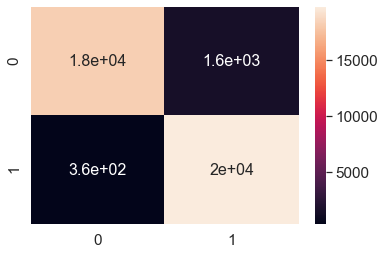

In [53]:
array = [[18275 ,1558],
         [  364 ,19788]]

df_cm = pd.DataFrame(array, range(2), range(2))
# plt.figure(figsize=(10,7))
sns.set(font_scale=1.4) # for label size
sns.heatmap(df_cm, annot=True, annot_kws={"size": 16}) # font size

plt.show()

In [54]:
print(classification_report(y_test,final_preds))

              precision    recall  f1-score   support

           0       0.92      0.94      0.93     19833
           1       0.94      0.91      0.93     20152

    accuracy                           0.93     39985
   macro avg       0.93      0.93      0.93     39985
weighted avg       0.93      0.93      0.93     39985



In [55]:
accuracy_NN = accuracy_score(y_test, final_preds)
print(accuracy_NN)

0.9268475678379392


# Decision Tree

In [56]:
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor

In [57]:
# Training a regression tree with max_depth=4.
regressor = DecisionTreeRegressor(random_state=42, max_depth=4)
regressor.fit(X_train, y_train)

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=4,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=42, splitter='best')

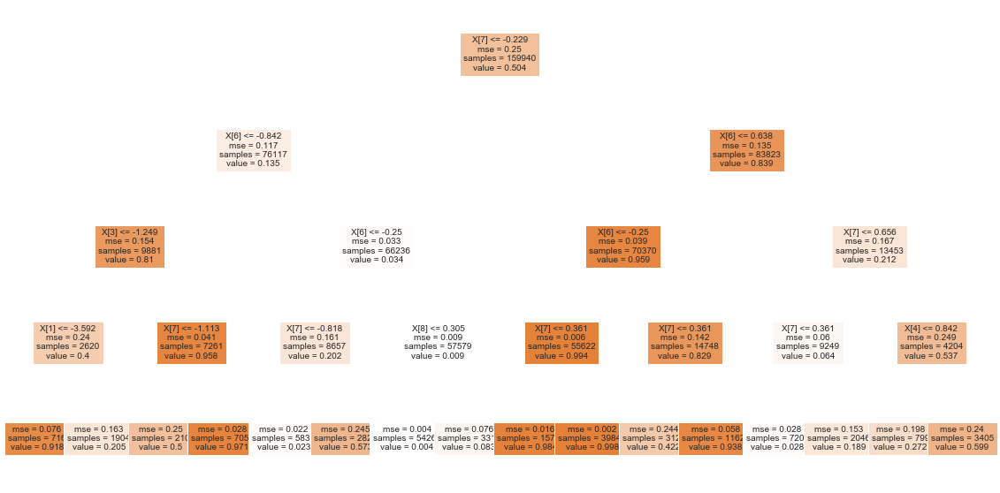

In [58]:
# Visualize the tree structure.
fig, ax = plt.subplots(figsize=(20, 10))
tree.plot_tree(regressor, filled=True, fontsize=10)
plt.show()

In [59]:
# Evaluate the model with the testing data
y_pred = regressor.predict(X_test)
score = r2_score(y_pred, y_test)
print("\nThe r2 score is: %.4f\n" % score)


mse_test = mean_squared_error(y_pred, y_test)
mse_train = mean_squared_error(regressor.predict(X_train), y_train)
print("The mean squared error (testing) is: %.4f\n" % mse_test)
print("The mean squared error (training) is: %.4f\n" % mse_train)


The r2 score is: 0.8508

The mean squared error (testing) is: 0.0325

The mean squared error (training) is: 0.0323



__Conclusion:__
+ Accuracy of Logistic Regression is 0.989446 but it is overfitting
+ Accuracy of Logistic Regression is 0.9268
+ Accuracy of Decision Tree: 0.8508